In [9]:
import mdtraj as md
import numpy as np
import scipy
from scipy.stats import linregress
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from itertools import combinations
import sys, os, re
from msmbuilder.decomposition import tICA as msm_tICA
from msmbuilder.featurizer import AtomPairsFeaturizer

sys.path.append(os.path.dirname(os.getcwd())) 
import amuset_tica

In [10]:
Ks27 = np.load("FIP35-Ks.npy")
lag_times = range(1, 101)
print(Ks27.shape)

(150, 27, 27)


In [11]:
ITSs, Es, Vs = [], [], []

for i in range(len(lag_times)):
    evK, vrK = np.linalg.eig(Ks27[i])
    idx = np.argsort(evK)[::-1]
    evK = evK[idx]
    vrK = vrK[:,idx]
    
    Es.append(evK)
    Vs.append(vrK)
    #print("Time =", lag_times[i], 'ps')
    ITSs.append([-lag_times[i]/np.log(Es[-1][j]) for j in range(1,6)])
    #print(ITSs[-1])
ITS27, Es27, Vs27 = np.array(ITSs).T, Es, Vs

from datetime import datetime
print(f"Current date and time: {datetime.now()}")

Current date and time: 2026-03-10 20:40:40.085044


In [12]:
# ============================================================
# 1. Core regression: fit M from K(t+1) ≈ K(t) M
# ============================================================

def fit_M_from_K_sequence(Ks, st=0, gap=1, num_pair=None, enforce_hermitian_M=False, rcond=None):
    """
    Fit M in the model K(t+1) ≈ K(t) M via least squares.

    Parameters
    ----------
    Ks : list or array-like of shape [T, d, d]
        Sequence of Hermitian (or general) matrices K(t),
        t = 0, ..., T-1.
    enforce_hermitian_M : bool, optional
        If True, M is projected onto the Hermitian cone:
        M <- (M + M^†) / 2
    rcond : float or None
        Passed to np.linalg.lstsq for numerical stability.

    Returns
    -------
    M : (d, d) np.ndarray
        Estimated propagator.
    info : dict
        Some diagnostics: residuals, norms, etc.
    """
    Ks = np.asarray(Ks)
    T, d1, d2 = Ks.shape
    assert d1 == d2, "K(t) must be square."
    if st < 0:
        st = T - st
    assert gap > 0, 'gap must be positive.'
    d = d1

    if T < st + gap + 1:
        raise ValueError("Need at least 2 valid matrices K(t) to fit M.")

    # Build stacked system:
    #   X M ≈ Y
    # where X = block rows of K(0..T-2), Y = block rows of K(1..T-1)
    X = Ks[st:-gap].reshape(-1, d)
    Y = Ks[st+gap:].reshape(-1, d)

    # Solve least squares: X M ≈ Y
    # np.linalg.lstsq handles complex numbers and uses SVD internally.
    M, residuals, rank, s = np.linalg.lstsq(X, Y, rcond=rcond)

    if enforce_hermitian_M:
        M = 0.5 * (M + M.conj().T)

    # Compute residuals in matrix form: R(t) = K(t+1) - K(t) M
    R_list = []
    rel_norms = []
    end_point = T-gap
    if num_pair and num_pair < end_point - st:
        end_point = st+num_pair
    for t in range(st, end_point):
        K_pred = Ks[t] @ M
        R = Ks[t + gap] - K_pred
        R_list.append(R)
        num = np.linalg.norm(R, ord="fro")
        den = np.linalg.norm(Ks[t + gap], ord="fro") + 1e-15
        rel_norms.append(num / den)

    info = {
        "residuals": np.array(R_list),      # shape: (T-1, d, d)
        "relative_residual_norms": np.array(rel_norms),  # length T-1
        "lstsq_residuals_raw": residuals,
        "rank_X": rank,
        "singular_values_X": s,
    }

    return M, info


# ============================================================
# 2. Fit A from K(0) ≈ A M
# ============================================================

def fit_A_from_K0_and_M(K0, M):
    """
    Fit A in the model K(0) ≈ A M using pseudoinverse.

    Parameters
    ----------
    K0 : (d, d) array
        First matrix in the sequence, K(0).
    M : (d, d) array
        Propagator matrix.

    Returns
    -------
    A : (d, d) array
    """
    M_pinv = np.linalg.pinv(M)
    A = K0 @ M_pinv
    return A


# ============================================================
# 3. Generate predicted K(t) from A and M
# ============================================================

def generate_K_from_A_M(A, M, T):
    """
    Generate model-predicted K(t) = A M^t for t = 0..T-1.

    Parameters
    ----------
    A : (d, d) array
    M : (d, d) array
    T : int
        Number of time steps.

    Returns
    -------
    K_model : (T, d, d) array
    """
    d = A.shape[0]
    K_model = np.zeros((T, d, d), dtype=complex if np.iscomplexobj(A) or np.iscomplexobj(M) else float)
    Mt = np.eye(d, dtype=K_model.dtype)
    for t in range(T):
        Mt = Mt @ M
        K_model[t] = A @ Mt
    return K_model


# RMSD

In [13]:
sub_sam = 5

rmsd1 = []
for i in range(25+33):
    if i < 25:
        txt_name = f"rmsd-beta1\\GTT-0-c-alpha-{i:03d}.txt"
    else:
        txt_name = f"rmsd-beta1\\GTT-1-c-alpha-{i-25:03d}.txt"
    data = np.loadtxt(txt_name)
    rmsd1.append(data[::sub_sam, 1])
    print(f'{i} [{rmsd1[-1].shape}]', end='')
    if i % 8 == 0 and i != 0:
        print()

print('#')

rmsd2 = []
for i in range(25+33):
    if i < 25:
        txt_name = f"rmsd-beta2\\GTT-0-c-alpha-{i:03d}.txt"
    else:
        txt_name = f"rmsd-beta2\\GTT-1-c-alpha-{i-25:03d}.txt"
    data = np.loadtxt(txt_name)
    rmsd2.append(data[::sub_sam, 1])
    print(f'{i} [{rmsd2[-1].shape}]', end='')
    if i % 8 == 0 and i != 0:
        print()


0 [(20000,)]1 [(20000,)]2 [(20000,)]3 [(20000,)]4 [(20000,)]5 [(20000,)]6 [(20000,)]7 [(20000,)]8 [(20000,)]
9 [(20000,)]10 [(20000,)]11 [(20000,)]12 [(20000,)]13 [(20000,)]14 [(20000,)]15 [(20000,)]16 [(20000,)]
17 [(20000,)]18 [(20000,)]19 [(20000,)]20 [(20000,)]21 [(20000,)]22 [(20000,)]23 [(20000,)]24 [(6518,)]
25 [(20000,)]26 [(20000,)]27 [(20000,)]28 [(20000,)]29 [(20000,)]30 [(20000,)]31 [(20000,)]32 [(20000,)]
33 [(20000,)]34 [(20000,)]35 [(20000,)]36 [(20000,)]37 [(20000,)]38 [(20000,)]39 [(20000,)]40 [(20000,)]
41 [(20000,)]42 [(20000,)]43 [(20000,)]44 [(20000,)]45 [(20000,)]46 [(20000,)]47 [(20000,)]48 [(20000,)]
49 [(20000,)]50 [(20000,)]51 [(20000,)]52 [(20000,)]53 [(20000,)]54 [(20000,)]55 [(20000,)]56 [(20000,)]
57 [(10826,)]#
0 [(20000,)]1 [(20000,)]2 [(20000,)]3 [(20000,)]4 [(20000,)]5 [(20000,)]6 [(20000,)]7 [(20000,)]8 [(20000,)]
9 [(20000,)]10 [(20000,)]11 [(20000,)]12 [(20000,)]13 [(20000,)]14 [(20000,)]15 [(20000,)]16 [(20000,)]
17 [(20000,)]18 [(20000,)]19 [(2000

In [14]:
rmsd1 = np.hstack(rmsd1)
rmsd2 = np.hstack(rmsd2)
print(len(rmsd1), len(rmsd2))

1137344 1137344


# IGME

In [15]:
K_hat = fit_M_from_K_sequence(Ks27[:46], 30, 1, enforce_hermitian_M=False)[0]

K_e, K_v = np.linalg.eig(K_hat)
idx = np.argsort(K_e)[::-1]
K_e_27 = K_e[idx]
K_v = K_v[:,idx]

Vt27 = np.load("FIP35-dim27-SVD-Vt.npy")
CVs_Khat = np.matmul(K_v[:, :5].T, Vt27)
print(K_e_27[:10])
print(-1.0/np.log(K_e_27[1:10])) # multiply by lag_time

[1.        +0.j 0.99993534+0.j 0.99899902+0.j 0.99653382+0.j
 0.99534882+0.j 0.994104  +0.j 0.99160667+0.j 0.99086396+0.j
 0.98972899+0.j 0.98848935+0.j]
[15464.67223371-0.j   998.52362771-0.j   288.00202399-0.j
   214.49876894-0.j   169.10605309-0.j   118.64155715-0.j
   108.95587324-0.j    96.86058756-0.j    86.37512966-0.j]


In [20]:
print(CVs_Khat.shape)
CVs_Khat[2] *= -1
CVs_Khat[3] *= -1
np.save('CVs_pred30-45.npy', CVs_Khat)

(5, 1137344)


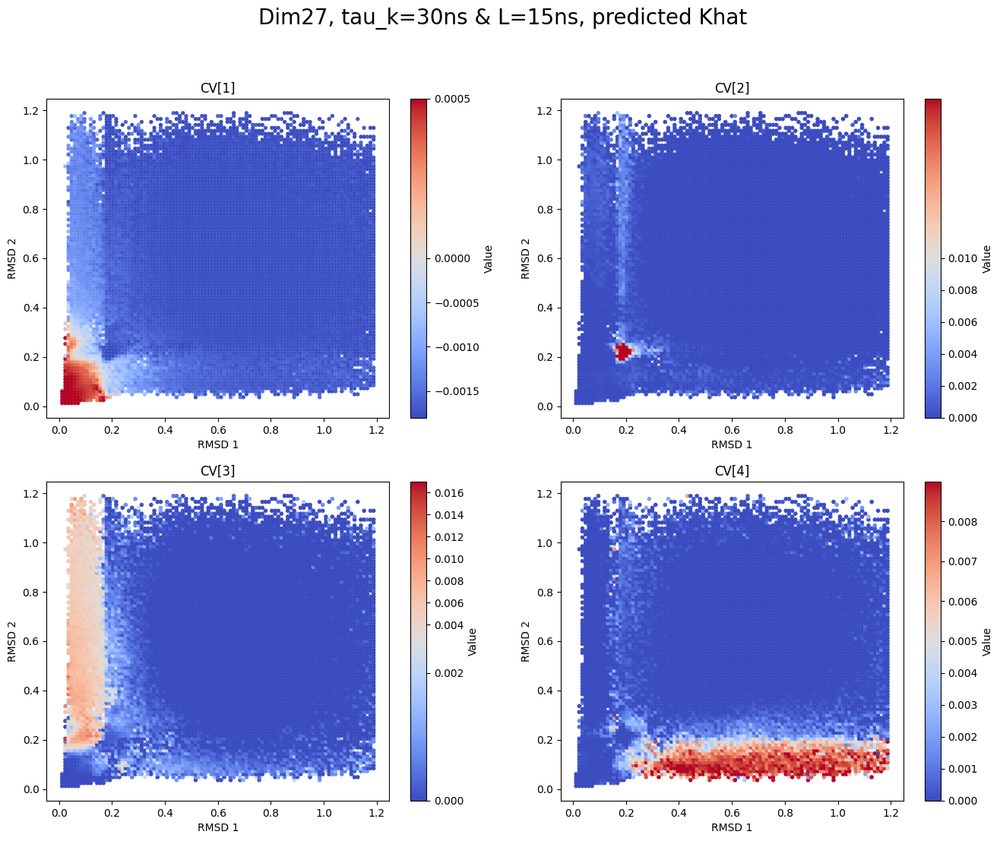

In [16]:
nx, ny = 100, 100
xmax, xmin, ymax, ymin = 1.2, 0., 1.2, 0. 
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
x_centers = np.arange(xmin, xmax, (xmax-xmin)/nx)
y_centers = np.arange(ymin, ymax, (ymax-ymin)/ny)
Xc, Yc = np.meshgrid(x_centers, y_centers, indexing="ij")

for i, ax in enumerate(axes.ravel()):
    CVi = np.real(CVs_Khat[i+1])
    
    z_count, z_value_sum = np.zeros((nx,ny), dtype=int), np.zeros((nx,ny), dtype=np.float32)
    for j in range(len(CVi)):
        if xmin <= rmsd1[j] < xmax and ymin <= rmsd2[j] < ymax:
            x_pos = int((rmsd1[j] - xmin) / (xmax - xmin) * nx)
            y_pos = int((rmsd2[j] - ymin) / (ymax - ymin) * ny)
            z_count[x_pos][y_pos] += 1
            z_value_sum[x_pos][y_pos] += CVi[j]

    z_plot = np.zeros((nx,ny), dtype=np.float32)
    for x_idx in range(nx):
        for y_idx in range(ny):
            z_plot[x_idx][y_idx] = np.nan if z_count[x_idx][y_idx] == 0 \
                else z_value_sum[x_idx][y_idx] / z_count[x_idx][y_idx]
    mask = ~np.isnan(z_plot)
    
    sign = -1 if i==1 or i==2 else 1
    if i == 0:
        norm = colors.TwoSlopeNorm(vmin=-.0018, vcenter=0, vmax=.0005)
        sc = ax.scatter(Xc[mask], Yc[mask], c=sign*z_plot[mask], s=8, cmap="coolwarm", norm=norm)
    elif i == 1:
        norm = colors.TwoSlopeNorm(vmin=0, vcenter=0.01, vmax=.011)
        sc = ax.scatter(Xc[mask], Yc[mask], c=sign*z_plot[mask], s=9, cmap="coolwarm", norm=norm)
    elif i == 2:
        norm = colors.TwoSlopeNorm(vmin=0, vcenter=0.0025, vmax=.017)
        sc = ax.scatter(Xc[mask], Yc[mask], c=sign*z_plot[mask], s=9, cmap="coolwarm", norm=norm)
    elif i == 3:
        norm = colors.TwoSlopeNorm(vmin=0, vcenter=0.005, vmax=.009)
        sc = ax.scatter(Xc[mask], Yc[mask], c=sign*z_plot[mask], s=9, cmap="coolwarm", norm=norm)
    else:
        sc = ax.scatter(Xc[mask], Yc[mask], c=sign*z_plot[mask], s=9, cmap="coolwarm")
    
    ax.set_xlabel("RMSD 1")
    ax.set_ylabel("RMSD 2")
    ax.set_title(f"CV[{i+1}]")
    cbar = fig.colorbar(sc, ax=ax)
    cbar.set_label("Value")

plt.suptitle("Dim27, tau_k=30ns & L=15ns, predicted Khat", fontsize=20)
plt.show()

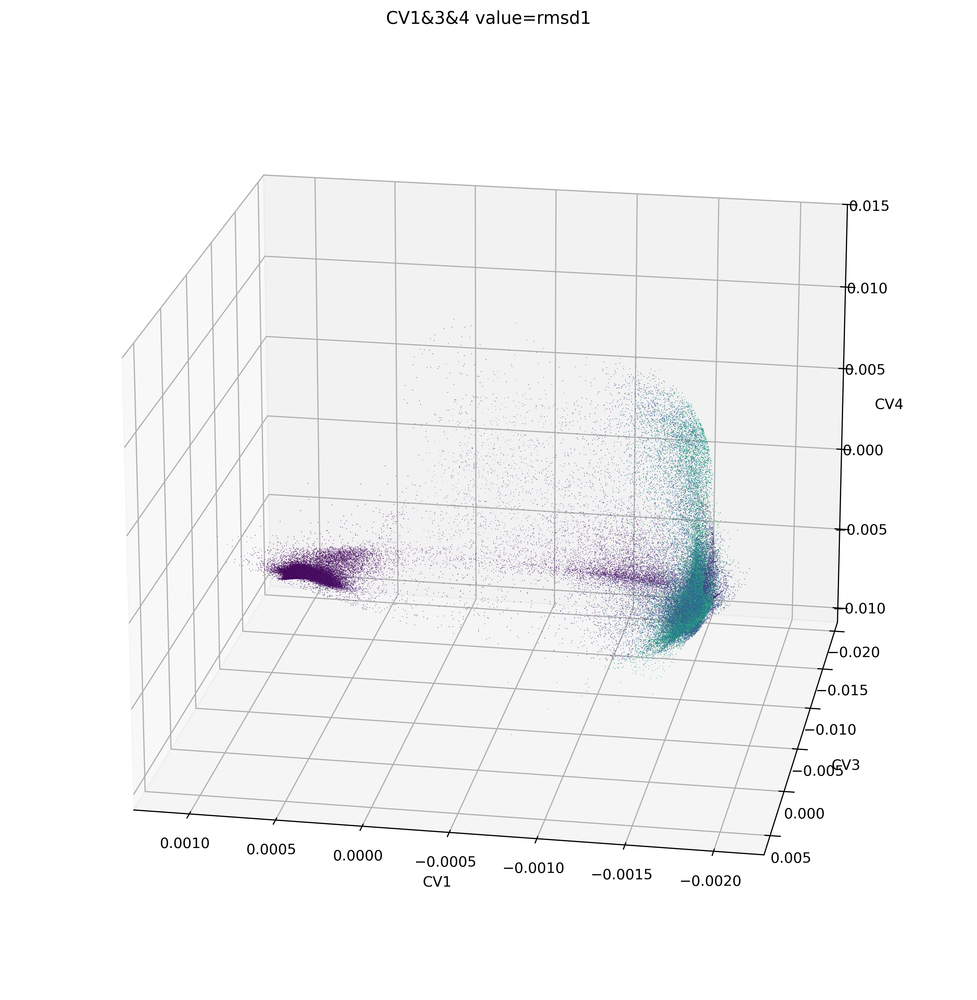

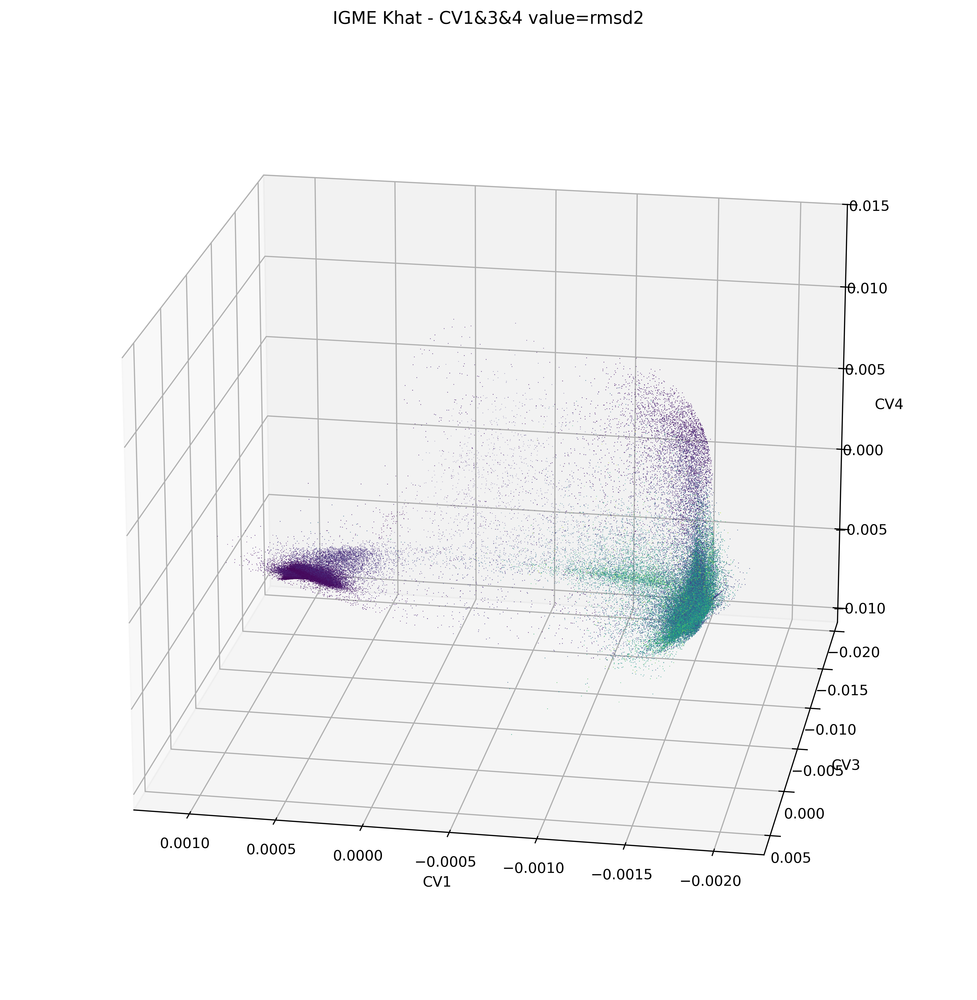

In [26]:
x,y,z = np.real(CVs_Khat[1]), np.real(CVs_Khat[3]), np.real(CVs_Khat[4]) #

fig = plt.figure(figsize=(16, 12), dpi=400)
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x[::2], y[::2], z[::2], s=.3, c=rmsd1[::2], edgecolors='none')
ax.set_xlabel("CV1")
ax.set_ylabel("CV3")
ax.set_zlabel("CV4")
plt.title('CV1&3&4 value=rmsd1')

ax.view_init(elev=20, azim=100)
plt.show()
fig = plt.figure(figsize=(16, 12), dpi=400)
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x[::2], y[::2], z[::2], s=.3, c=rmsd2[::2], edgecolors='none')
ax.set_xlabel("CV1")
ax.set_ylabel("CV3")
ax.set_zlabel("CV4")
plt.title('IGME Khat - CV1&3&4 value=rmsd2')

ax.view_init(elev=20, azim=100)
plt.show()

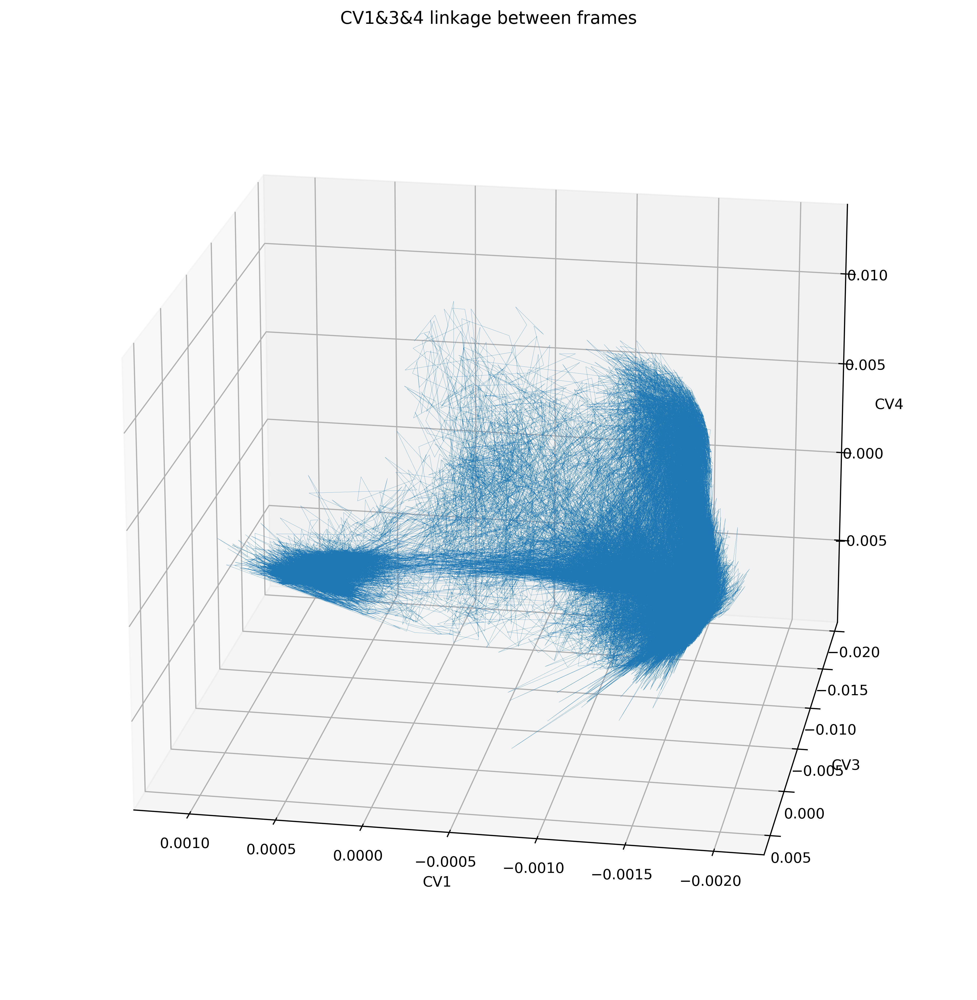

In [23]:
fig = plt.figure(figsize=(16, 12), dpi=400)
ax = fig.add_subplot(111, projection="3d")
ax.plot3D(x[::2], y[::2], z[::2], linewidth=.1)
ax.set_xlabel("CV1")
ax.set_ylabel("CV3")
ax.set_zlabel("CV4")
plt.title('CV1&3&4 linkage between frames')

ax.view_init(elev=20, azim=100)
plt.show()

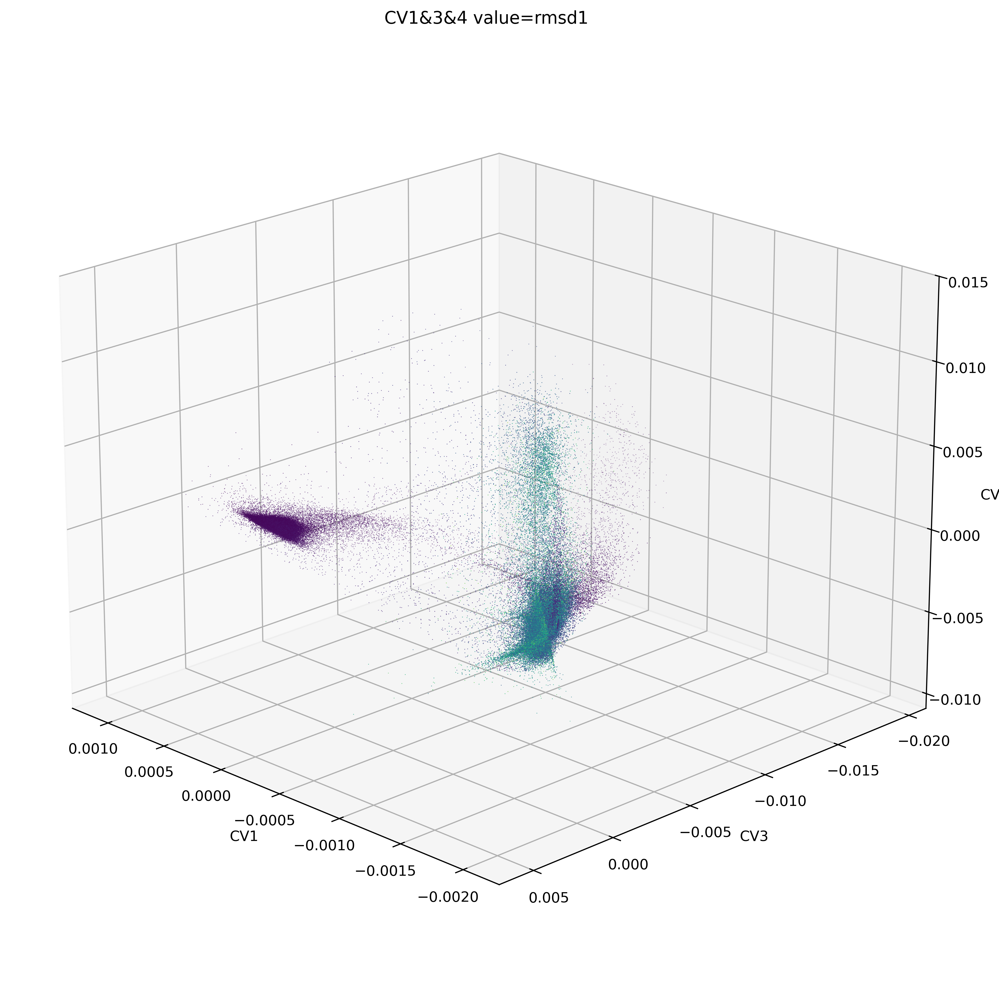

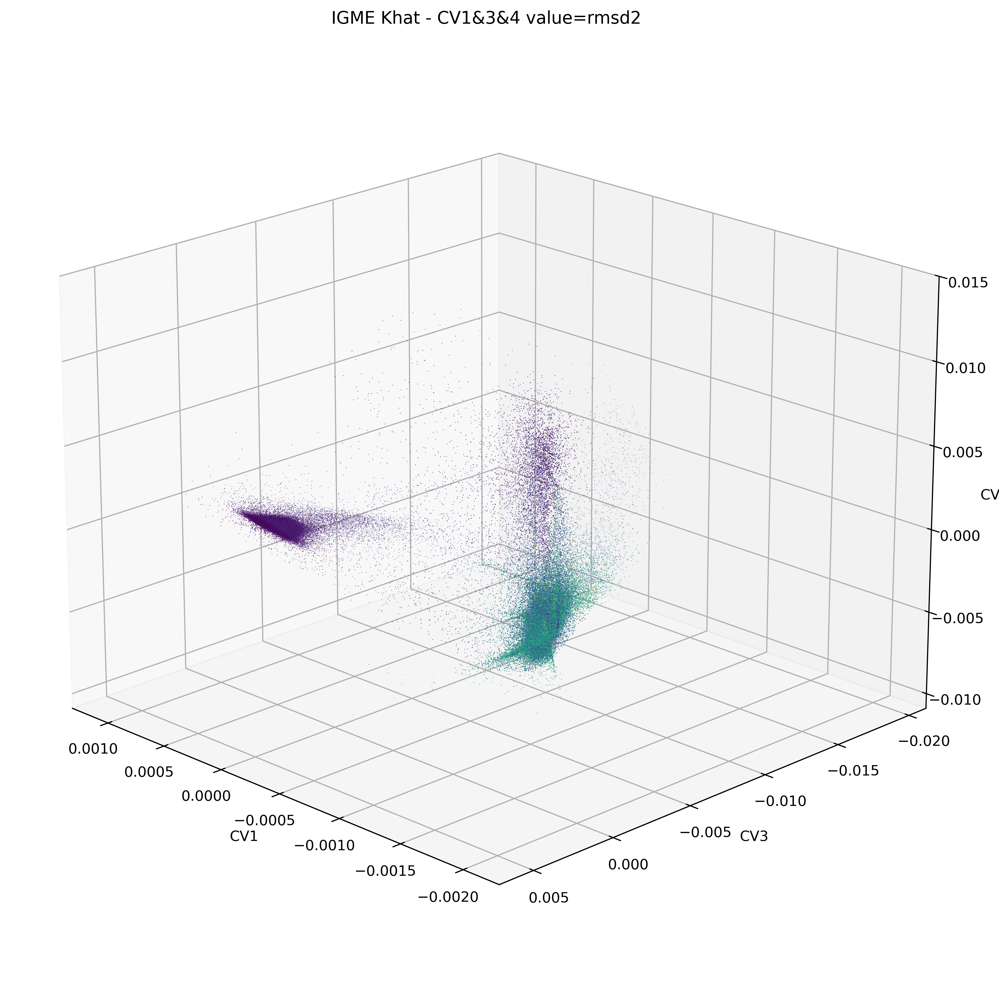

In [25]:
x,y,z = np.real(CVs_Khat[1]), np.real(CVs_Khat[3]), np.real(CVs_Khat[4]) #

fig = plt.figure(figsize=(16, 12), dpi=400)
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x[::2], y[::2], z[::2], s=.3, c=rmsd1[::2], edgecolors='none')
ax.set_xlabel("CV1")
ax.set_ylabel("CV3")
ax.set_zlabel("CV4")
plt.title('CV1&3&4 value=rmsd1')

ax.view_init(elev=20, azim=135)
plt.show()
fig = plt.figure(figsize=(16, 12), dpi=400)
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x[::2], y[::2], z[::2], s=.3, c=rmsd2[::2], edgecolors='none')
ax.set_xlabel("CV1")
ax.set_ylabel("CV3")
ax.set_zlabel("CV4")
plt.title('IGME Khat - CV1&3&4 value=rmsd2')

ax.view_init(elev=20, azim=135)
plt.show()

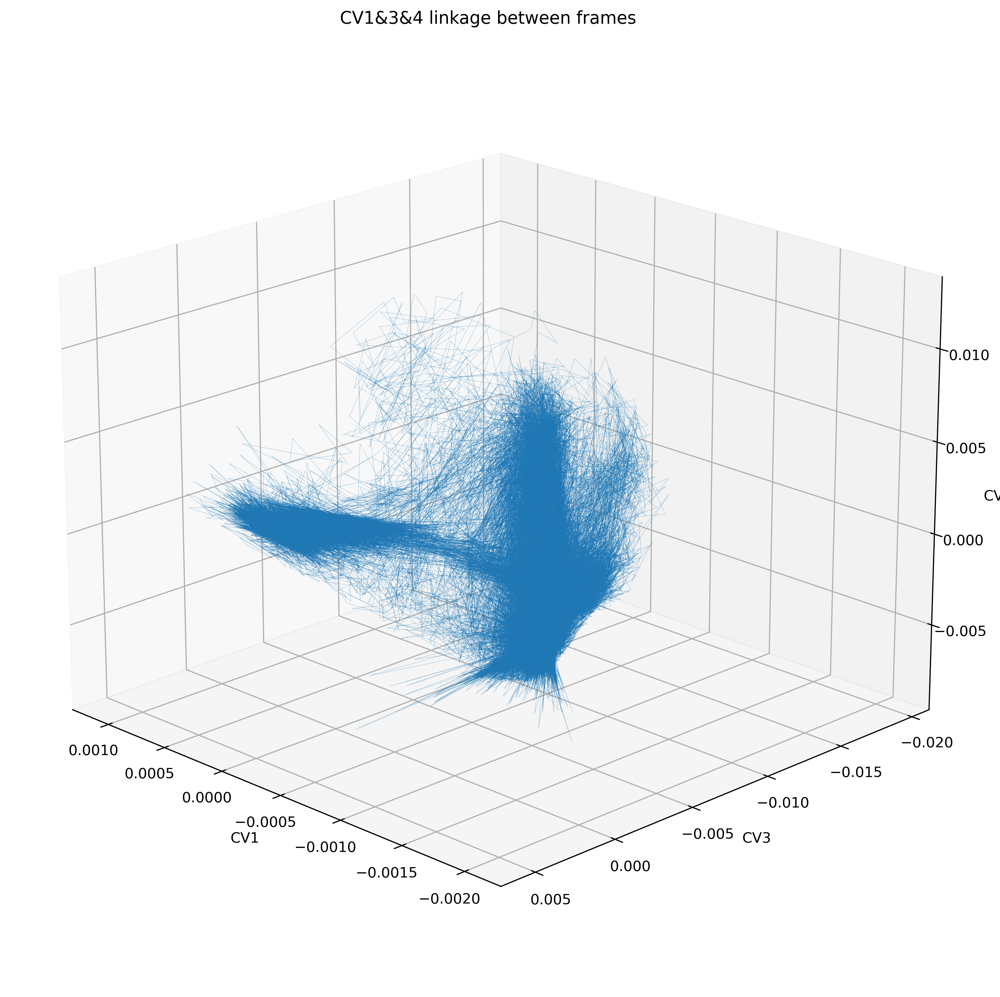

In [27]:
fig = plt.figure(figsize=(16, 12), dpi=400)
ax = fig.add_subplot(111, projection="3d")
ax.plot3D(x[::2], y[::2], z[::2], linewidth=.1)
ax.set_xlabel("CV1")
ax.set_ylabel("CV3")
ax.set_zlabel("CV4")
plt.title('CV1&3&4 linkage between frames')

ax.view_init(elev=20, azim=135)
plt.show()